In [13]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as util
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [14]:
manual_seed = 999
# manual_seed = random.randint(1, 1000)
# print(f"Random Seed: {manual_seed}")
random.seed(manual_seed)
torch.manual_seed(manual_seed)

In [15]:
!unzip -qq /content/drive/MyDrive/celeba.zip

replace img_align_celeba/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [16]:
# config
DATA_ROOT = "/content/img_align_celeba"
NUM_WORKERS = 4
BATCH_SIZE = 128
# Spatial size of training images. All images will be resized to this size using a transformer.
IMAGE_SIZE = 64
NUM_CHANNELS = 3
LATENT_VECTOR_SIZE = 100
GENERATOR_FEATURE_MAP_SIZE = 64
DISCRIMINATOR_FEATURE_MAP_SIZE = 64
NUM_EPOCHS = 5
LEARNING_RATE = 0.0002
ADAM_BETA_1 = 0.5
NUM_GPUS = 1

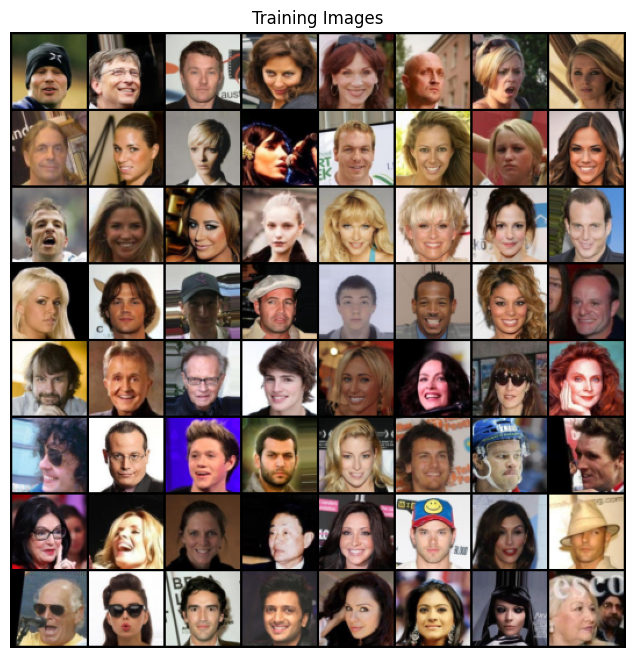

In [17]:
dataset = dataset.ImageFolder(root=DATA_ROOT,
                              transform=transforms.Compose([
                                  transforms.Resize(IMAGE_SIZE),
                                  transforms.CenterCrop(IMAGE_SIZE),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                              ]))

data_loader = torch.utils.data.DataLoader(dataset,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True,
                                          num_workers=NUM_WORKERS)

device = torch.device("cuda:0" if torch.cuda.is_available() and NUM_GPUS > 0 else "cpu")

# Plot the first training image batch
real_batch = next(iter(data_loader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(util.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

# Weights Initialization

In [18]:
# From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02.
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find("Conv") != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find("BatchNorm") != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0.0)

# Generator

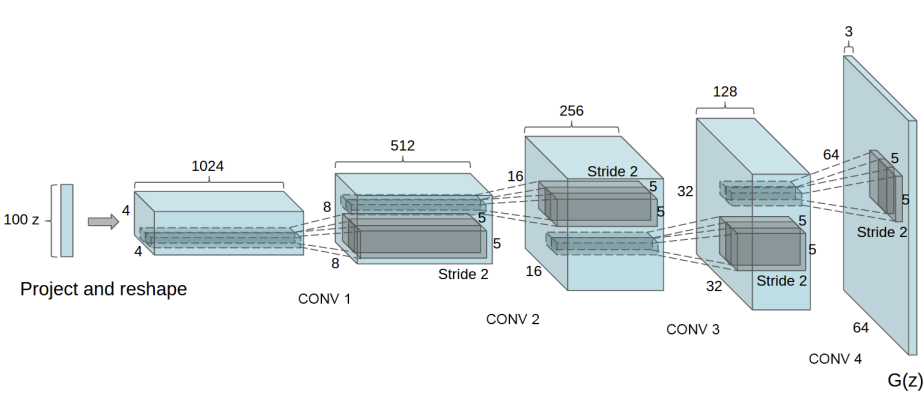

In [19]:
class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator, self).__init__()
    self.ngpu = ngpu
    self.model = nn.Sequential(
        nn.ConvTranspose2d(in_channels=LATENT_VECTOR_SIZE, out_channels=GENERATOR_FEATURE_MAP_SIZE * 8, kernel_size=4, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(GENERATOR_FEATURE_MAP_SIZE * 8),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=GENERATOR_FEATURE_MAP_SIZE * 8, out_channels=GENERATOR_FEATURE_MAP_SIZE * 4, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(GENERATOR_FEATURE_MAP_SIZE * 4),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=GENERATOR_FEATURE_MAP_SIZE * 4, out_channels=GENERATOR_FEATURE_MAP_SIZE * 2, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(GENERATOR_FEATURE_MAP_SIZE * 2),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=GENERATOR_FEATURE_MAP_SIZE * 2, out_channels=GENERATOR_FEATURE_MAP_SIZE, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(GENERATOR_FEATURE_MAP_SIZE),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=GENERATOR_FEATURE_MAP_SIZE, out_channels=NUM_CHANNELS, kernel_size=4, stride=2, padding=1, bias=False),
        nn.Tanh(),
    )

  def forward(self, input_):
    return self.model(input_)

In [20]:
netG = Generator(NUM_GPUS).to(device)
if device.type == "cuda" and NUM_GPUS > 1:
  netG = nn.DataParallel(netG, list(range(NUM_GPUS)))

netG.apply(weights_init)
print(netG)

Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [21]:
class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator, self).__init__()
    self.ngpu = ngpu
    self.model = nn.Sequential(
        nn.Conv2d(in_channels=NUM_CHANNELS, out_channels=DISCRIMINATOR_FEATURE_MAP_SIZE, kernel_size=4, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(in_channels=DISCRIMINATOR_FEATURE_MAP_SIZE, out_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 2, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(DISCRIMINATOR_FEATURE_MAP_SIZE * 2),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(in_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 2, out_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 4, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(DISCRIMINATOR_FEATURE_MAP_SIZE * 4),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(in_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 4, out_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 8, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(DISCRIMINATOR_FEATURE_MAP_SIZE * 8),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(in_channels=DISCRIMINATOR_FEATURE_MAP_SIZE * 8, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
        nn.Sigmoid()
    )

  def forward(self, input_):
    return self.model(input_)

In [22]:
netD= Discriminator(NUM_GPUS).to(device)
if device.type == "cuda" and NUM_GPUS > 1:
  netD = nn.DataParallel(netG, list(range(NUM_GPUS)))

netD.apply(weights_init)
print(netD)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Training

In [23]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(BATCH_SIZE, LATENT_VECTOR_SIZE, 1, 1, device=device)

real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=LEARNING_RATE, betas=(ADAM_BETA_1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LEARNING_RATE, betas=(ADAM_BETA_1, 0.999))

In [26]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
ones_label = torch.full((BATCH_SIZE, ), real_label,dtype=torch.float, device=device)
zeros_label = torch.full((BATCH_SIZE, ), fake_label,dtype=torch.float, device=device)

print("Starting Training Loop...")
# For each epoch
for epoch in range(NUM_EPOCHS):
    # For each batch in the dataloader
    for i, data in enumerate(data_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        ones_ = ones_label[:b_size]
        zeros_ = zeros_label[:b_size]
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, ones_)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, LATENT_VECTOR_SIZE, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, zeros_)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, ones_)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, NUM_EPOCHS, i, len(data_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == NUM_EPOCHS-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(util.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.8070	Loss_G: 5.6142	D(x): 0.5887	D(G(z)): 0.6103 / 0.0063
[0/5][50/1583]	Loss_D: 0.3924	Loss_G: 21.0492	D(x): 0.8546	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 0.4863	Loss_G: 6.6600	D(x): 0.8798	D(G(z)): 0.1954 / 0.0022
[0/5][150/1583]	Loss_D: 0.8944	Loss_G: 5.2775	D(x): 0.7203	D(G(z)): 0.2954 / 0.0145
[0/5][200/1583]	Loss_D: 0.4315	Loss_G: 3.4381	D(x): 0.7571	D(G(z)): 0.0613 / 0.0529
[0/5][250/1583]	Loss_D: 0.5818	Loss_G: 5.7454	D(x): 0.8663	D(G(z)): 0.2697 / 0.0072
[0/5][300/1583]	Loss_D: 0.3668	Loss_G: 4.0079	D(x): 0.8491	D(G(z)): 0.1244 / 0.0291
[0/5][350/1583]	Loss_D: 0.5044	Loss_G: 3.7596	D(x): 0.6780	D(G(z)): 0.0283 / 0.0410
[0/5][400/1583]	Loss_D: 0.8369	Loss_G: 7.1801	D(x): 0.9692	D(G(z)): 0.4860 / 0.0026
[0/5][450/1583]	Loss_D: 0.8770	Loss_G: 5.3506	D(x): 0.8204	D(G(z)): 0.4147 / 0.0133
[0/5][500/1583]	Loss_D: 0.5642	Loss_G: 6.6584	D(x): 0.9154	D(G(z)): 0.3117 / 0.0028
[0/5][550/1583]	Loss_D: 0.7908	Loss_G: 7.6027	D(x): 

# Results

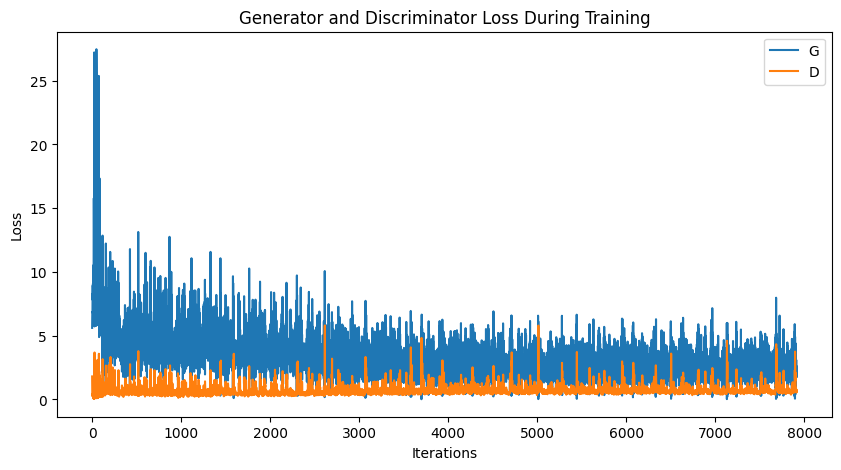

In [30]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

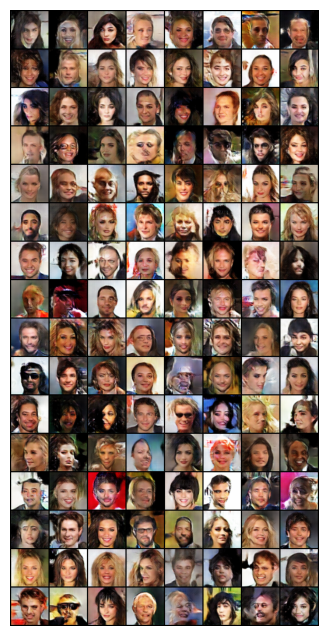

In [31]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

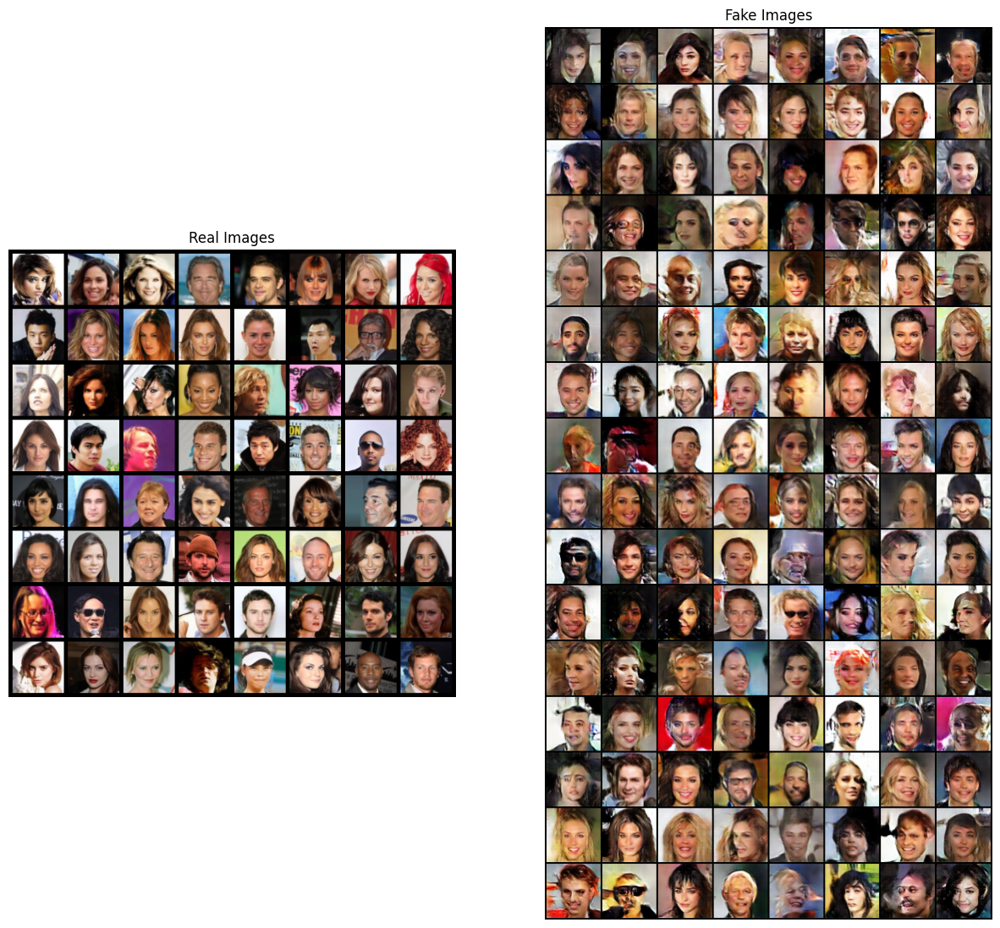

In [29]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(data_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(util.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()